# Game2Vec
The notebook is about the prototype version of the project within recommender systems.
The notebook is divided into 4 segments:
- data preparation 
- creation and learning of the model
- application of the model to compute representations for games and creation of a simple system for recommendation
- PCA analysis 

###  Load the libraries you need

In [2]:
import json
import pandas as pd
import numpy as np
import torch
import re
from datetime import datetime
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset
import torch.optim as optim
import torch.nn as nn
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import fasttext
import fasttext.util
import spacy

## Data Preparation
Data loaded from a file downloaded directly from the kaggle platform a collection of approximately 80000 games

In [3]:
df = pd.read_json("data/final_data_new.json")
df = df.drop_duplicates(subset=["date","developer","publisher","name"])
df.head()

,img_url,date,developer,publisher,full_desc,requirements,popu_tags,price,url_info,name,categories,pegi
0,https://steamcdn-a.akamaihd.net/steam/apps/945...,"Nov 16, 2018",Innersloth,Innersloth,"{'sort': 'game', 'desc': 'About This Game Play...",{'minimum': {'windows': {'processor': ' SSE2 i...,"[Multiplayer, Online, Space, Social, Deduction...",499,{'url': 'https://store.steampowered.com/app/94...,Among Us,"[Online PvPLAN, PvPOnline Co-opLAN, Co-opCross...",NaN
1,https://steamcdn-a.akamaihd.net/steam/apps/730...,"Aug 21, 2012","Valve, Hidden Path Entertainment",Valve,"{'sort': 'game', 'desc': 'About This Game Coun...",{'minimum': {'windows': {'processor': ' Intel®...,"[Shooter, Multiplayer, Competitive, Action, Te...",free,{'url': 'https://store.steampowered.com/app/73...,Counter-Strike: Global Offensive,"[Steam Achievements Full, controller supportSt...",NaN
2,https://steamcdn-a.akamaihd.net/steam/apps/109...,"Aug 3, 2020",Mediatonic,Devolver Digital,"{'sort': 'game', 'desc': 'About This Game Fall...",{},"[Multiplayer, Funny, Battle, Royale, Online, F...",199,{'url': 'https://store.steampowered.com/app/10...,Fall Guys: Ultimate Knockout,"[MMOOnline PvPOnline, Co-opSteam Achievements ...",NaN
3,https://steamcdn-a.akamaihd.net/steam/apps/115...,"Sep 1, 2020",Paradox Development Studio,Paradox Interactive,"{'sort': 'game', 'desc': 'About This Game Para...",{},"[Strategy, Simulation, Medieval, Grand, Strate...",499,{'url': 'https://store.steampowered.com/app/11...,Crusader Kings III,"[Single-playerOnline PvPSteam, Achievements St...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...
4,https://steamcdn-a.akamaihd.net/steam/apps/108...,"Oct 1, 2019",Bungie,Bungie,"{'sort': 'game', 'desc': 'About This Game Dive...",{},"[Free, Play, Looter, Shooter, Multiplayer, Act...",free,{'url': 'https://store.steampowered.com/app/10...,Destiny 2,"[Single-playerOnline PvPOnline, Co-opSteam Ach...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...


#### Get appid

In [4]:
def get_appid(row):
    if type(row) == dict and 'url' in row.keys():
        return row['url'].split('/')[4]
    else:
        None

df.loc[:, 'appid'] = df['url_info'].apply(lambda x: get_appid(x))

### Take only useful columns

In [5]:
selected_df = df[['date', 'developer', 'publisher', 'full_desc','popu_tags', 'price', 'name', 'categories','pegi', 'appid']]
selected_df.head()

,date,developer,publisher,full_desc,popu_tags,price,name,categories,pegi,appid
0,"Nov 16, 2018",Innersloth,Innersloth,"{'sort': 'game', 'desc': 'About This Game Play...","[Multiplayer, Online, Space, Social, Deduction...",499,Among Us,"[Online PvPLAN, PvPOnline Co-opLAN, Co-opCross...",NaN,945360
1,"Aug 21, 2012","Valve, Hidden Path Entertainment",Valve,"{'sort': 'game', 'desc': 'About This Game Coun...","[Shooter, Multiplayer, Competitive, Action, Te...",free,Counter-Strike: Global Offensive,"[Steam Achievements Full, controller supportSt...",NaN,730
2,"Aug 3, 2020",Mediatonic,Devolver Digital,"{'sort': 'game', 'desc': 'About This Game Fall...","[Multiplayer, Funny, Battle, Royale, Online, F...",199,Fall Guys: Ultimate Knockout,"[MMOOnline PvPOnline, Co-opSteam Achievements ...",NaN,1097150
3,"Sep 1, 2020",Paradox Development Studio,Paradox Interactive,"{'sort': 'game', 'desc': 'About This Game Para...","[Strategy, Simulation, Medieval, Grand, Strate...",499,Crusader Kings III,"[Single-playerOnline PvPSteam, Achievements St...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...,1158310
4,"Oct 1, 2019",Bungie,Bungie,"{'sort': 'game', 'desc': 'About This Game Dive...","[Free, Play, Looter, Shooter, Multiplayer, Act...",free,Destiny 2,"[Single-playerOnline PvPOnline, Co-opSteam Ach...",{'pegi_url': 'https://steamstore-a.akamaihd.ne...,1085660


## Clearing columns
- 'full_desc' column taking only game description
- 'price' column changed from  values 'free' to 0
- 'date' column changed to game age as int counting from 2022
- 'pegs' column changed into values 0, 3, 6, 10, 12, 13, 15, 17 and 18 based on ESRB and GSRR ratings

In [6]:
def get_desc(row):
    if type(row) == dict and 'desc' in row.keys():
        return row['desc']
    else:
        None

In [7]:
selected_df.loc[:, 'full_desc'] = selected_df['full_desc'].apply(lambda x: get_desc(x))

/home/macron/.local/lib/python3.9/site-packages/pandas/core/indexing.py:1951: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[selected_item_labels] = value


In [8]:
def get_year(row):
    try:
        dt = datetime.strptime(row, '%b %d, %Y')
        return str(2022-int(dt.year))
    except:
        return 0
    

In [9]:
selected_df.loc[:, 'date'] = selected_df['date'].apply(lambda x: get_year(x))

In [10]:
def get_price(row):
    try:
        if row == 'free':
            return 0
        else:
            return row
    except:
        return 0

In [11]:
selected_df.loc[:, 'price'] = selected_df['price'].apply(lambda x: get_price(x))

In [12]:
pegi_translations = {'ESRB/e.png' : 3, 'ESRB/ec.png' : 10, 'CSRR/C12.png' : 12, 'CSRR/P6.png' : 6, 'ESRB/t.png' : 13, 'CSRR/R.png' : 18, 'ESRB/ao.png' : 18, 'CSRR/C15.png' : 15, 'ESRB/rp.png' : 10, 'CSRR/G.png' : 3, 'ESRB/e10.png' : 10, 'ESRB/m.png' : 17}

def get_pegi(row):
    try:
        if row and 'pegi_url' in row:
            return pegi_translations[row['pegi_url']]
        else:
            return 10
    except:
        return 0

In [13]:
selected_df.loc[:, 'pegi'] = selected_df['pegi'].apply(lambda x: get_pegi(x))

### Cleaning columns with genre tags and categories

In [14]:
def clean(list_to_clen):
    big_c = []
    for elem in list_to_clen:
        if type(elem) == list:
            big_c.extend(elem)
        else:
            big_c.append(elem)
    u_big_c = list(set(big_c))
    return u_big_c

In [15]:
def recurention_search(word, tags, tags_m1):
    find_tags = []
    if len(word) > 0:
        for index in range(len(word)+1):
            #print(word[:index])
            if word[:index] in tags or (index == len(word) and (word[:index +1] in tags or word[:index] in tags_m1)):
                find_tags.extend([word[:index]]+ recurention_search(word[index:],tags, tags_m1))
                return find_tags
    return []

In [16]:
def check_in_tags(word, tags):
    tags_part = []
    word = word.replace('+', '')
    for elem in tags:
        if word in elem:
            tags_part.append(elem)
    return tags_part

In [17]:
def clean_tags(row, tags, tags_m1):
    cleaned = []
    if type(row)==list:
        for tag in row:            
            if tag in tags:
                cleaned.append(tag)
            elif tag[:-1] in tags:
                cleaned.append(tag[:-1])
                if tag[-1] == '2':
                    cleaned.append('2D')
                elif tag[-1] == '3':
                    cleaned.append('3D')
                elif tag[-1] == '4':
                    cleaned.append('4X')
                elif tag[-1] == '6':
                    cleaned.append('6DOF')
            elif len(tag) > 1 and tag[:-2] in tags:
                cleaned.append(tag[:-2])
                if tag[-2] == '2.':
                    cleaned.append('2.5D')
            elif type(tag)==str and len(tag) > 2:
                found_tags =  check_in_tags(tag, tags)
                if not found_tags:
                    cleaned.extend(recurention_search(tag,tags,tags_m1))
                else:
                    cleaned.extend(found_tags)
            else:
                cleaned.append(tag)
    elif row == 2:
        cleaned.append('2D')
    elif row == 3:
        cleaned.append('3D')
    elif row == 4:
        cleaned.append('4X')
    elif row == 6:
        cleaned.append('6DOF')
    else:
        cleaned.append(row)
    return list(set(cleaned))

In [18]:
#TESTS
word = "Soundtrack1980s1990'"
tags = ["Soundtrack","1980s","1990's"]
tags_m1 = ["Soundtrac","1980","1990'"]
check = recurention_search(word,tags, tags_m1)
assert check == ['Soundtrack', '1980s', "1990'"]

In [19]:
tag_list = []
with open('taglist.txt', 'r') as fp:
    lines = fp.readlines()
    for ii, line in enumerate(lines):
        tag_list.append(line[:-1])

category_list = []
with open('categorylist.txt', 'r') as fp:
    lines = fp.readlines()
    for ii, line in enumerate(lines):
        category_list.append(line[:-1])

In [20]:
tags_m1 = [x[-1] for x in tag_list if len(x) > 1]
selected_df.loc[:, 'popu_tags'] = selected_df['popu_tags'].apply(lambda x: clean_tags(x, tag_list, tags_m1))

/home/macron/.local/lib/python3.9/site-packages/pandas/core/indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [21]:
categories_m1 = [x[-1] for x in category_list if len(x) > 1]
selected_df.loc[:, 'categories'] = selected_df['categories'].apply(lambda x: clean_tags(x, category_list, categories_m1))

In [22]:
tag_new_list = sorted(selected_df['popu_tags'].to_list(), key=lambda x: -len(x))
cat_new_list = sorted(selected_df['categories'].to_list(), key=lambda x: -len(x))

In [23]:
len(clean(tag_new_list))

389

#### All used genre tags in dataset

In [24]:
#clean(tag_new_list)

In [25]:
selected_df.head()

,date,developer,publisher,full_desc,popu_tags,price,name,categories,pegi,appid
0,4,Innersloth,Innersloth,About This Game Play with 4-10 player online o...,"[Local Multiplayer, Aliens, Social Deduction, ...",499,Among Us,"[Remote Play on Tablet, Online PvP, Remote Pla...",0,945360
1,10,"Valve, Hidden Path Entertainment",Valve,About This Game Counter-Strike: Global Offensi...,"[Third-Person Shooter, Fast-Paced, Multiplayer...",0,Counter-Strike: Global Offensive,"[Steam Achievements, Remote Play on Tablet, Re...",0,730
2,2,Mediatonic,Devolver Digital,About This Game Fall Guys: Ultimate Knockout f...,"[Local Multiplayer, Party, Soundtrack, Card Ga...",199,Fall Guys: Ultimate Knockout,"[Remote Play on Tablet, Remote Play on Phone]",0,1097150
3,2,Paradox Development Studio,Paradox Interactive,About This Game Paradox Development Studio bri...,"[Political, Soundtrack, Management, Real-Time ...",499,Crusader Kings III,"[Online PvP, Single-player]",0,1158310
4,3,Bungie,Bungie,About This Game Dive into the world of Destiny...,"[Atmospheric, First-Person, Soundtrack, World ...",0,Destiny 2,"[Remote Play on Tablet, Online PvP, Remote Pla...",0,1085660


### Change descriptions into representations

In [24]:
description_features_fasttext_count = 300
description_features_count = 40

fasttext.util.download_model('en', if_exists='ignore') 
fasttext_model = fasttext.load_model('cc.en.300.bin')

In [25]:
nlp = spacy.load("en_core_web_sm", exclude=["ner", "senter"])

def clean_text_tokens(text):
    return " ".join(token.lemma_ for token in nlp(text) if not token.is_stop)

def get_representation(text):
    if text is not None:
        text = clean_text_tokens(text)
        return fasttext_model.get_sentence_vector(text)[0:description_features_fasttext_count]
    else:
        return [0.0] * description_features_fasttext_count

/home/macron/.local/lib/python3.9/site-packages/spacy/util.py:730: UserWarning: [W095] Model 'en_core_web_sm' (3.0.0) was trained with spaCy v3.0 and may not be 100% compatible with the current version (3.1.1). If you see errors or degraded performance, download a newer compatible model or retrain your custom model with the current spaCy version. For more details and available updates, run: python -m spacy validate
  warnings.warn(warn_msg)


In [26]:
selected_df.loc[:, 'full_desc'] = selected_df['full_desc'].apply(lambda x: get_representation(x))

### Fill missing values with 0

In [26]:
tag_dataset = selected_df[['date','popu_tags', 'categories', 'price','pegi', 'full_desc', 'appid','name']].fillna(0)

In [27]:
tag_dataset

,date,popu_tags,categories,price,pegi,full_desc,appid,name
0,4,"[Local Multiplayer, Aliens, Social Deduction, ...","[Remote Play on Tablet, Online PvP, Remote Pla...",499,0,About This Game Play with 4-10 player online o...,945360,Among Us
1,10,"[Third-Person Shooter, Fast-Paced, Multiplayer...","[Steam Achievements, Remote Play on Tablet, Re...",0,0,About This Game Counter-Strike: Global Offensi...,730,Counter-Strike: Global Offensive
2,2,"[Local Multiplayer, Party, Soundtrack, Card Ga...","[Remote Play on Tablet, Remote Play on Phone]",199,0,About This Game Fall Guys: Ultimate Knockout f...,1097150,Fall Guys: Ultimate Knockout
3,2,"[Political, Soundtrack, Management, Real-Time ...","[Online PvP, Single-player]",499,0,About This Game Paradox Development Studio bri...,1158310,Crusader Kings III
4,3,"[Atmospheric, First-Person, Soundtrack, World ...","[Remote Play on Tablet, Online PvP, Remote Pla...",0,0,About This Game Dive into the world of Destiny...,1085660,Destiny 2
...,...,...,...,...,...,...,...,...
74802,0,"[Turn-Based Combat, Turn-Based Tactics, First-...",[Single-player],0,0,About This Game It is an online action and sur...,0,RIO - Raised In Oblivion
74803,0,"[Turn-Based Combat, Turn-Based Tactics, First-...",[Single-player],0,0,About This Game With all the knowledge I gaine...,0,Polycalypse: Last bit of Hope
74805,0,"[Turn-Based Combat, Turn-Based Tactics, First-...",[Online PvP],0,0,About This Game About This GameSuper Buckyball...,1341230,Super Buckyball Tournament Preseason
74806,0,"[Turn-Based Combat, Turn-Based Tactics, Anime,...","[Steam Cloud, Single-player]",0,0,"About This Game Tired of living in poverty, Li...",0,Lisa and the Grimoire


#### One-Hot encoding for column with genre tags (popu_tags)

In [59]:
tag_dataset_of = tag_dataset.join(tag_dataset.categories.str.join('|').str.get_dummies())
tag_dataset_of = tag_dataset.join(tag_dataset.popu_tags.str.join('|').str.get_dummies())

In [30]:
tag_dataset_of = tag_dataset_of.drop('popu_tags', 1)
tag_dataset_of = tag_dataset_of.drop('categories', 1)
tag_dataset_of[tag_dataset_of['price']==''] = 0

/tmp/ipykernel_53590/1151071744.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  tag_dataset_of = tag_dataset_of.drop('popu_tags', 1)
/tmp/ipykernel_53590/1151071744.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  tag_dataset_of = tag_dataset_of.drop('categories', 1)


In [31]:
tag_dataset_of.columns

Index(['date', 'price', 'pegi', 'full_desc', '&', ''', '+', '++', '-+', '-.',
       ...
       'Warhammer 40K', 'Web Publishing', 'Well-Written', 'Werewolves',
       'Western', 'Word Game', 'World War I', 'World War II', 'Wrestling',
       'Zombies'],
      dtype='object', length=392)

In [32]:
def fix_zeroes(d):
    if type(d) is int:
        return [0.0] * description_features_fasttext_count
    else:
        return d

tag_dataset_of.loc[:, 'full_desc'] = tag_dataset_of['full_desc'].apply(lambda x: fix_zeroes(x))

split_df = pd.DataFrame.from_records(tag_dataset_of['full_desc'].tolist(), columns = [f'fd_{x}' for x in range(description_features_fasttext_count)])
tag_dataset_of = pd.concat([tag_dataset_of, split_df], axis=1)
tag_dataset_of = tag_dataset_of.drop('full_desc', axis=1).fillna(0)


In [33]:
tag_dataset_of = tag_dataset_of.drop('&', axis=1)
tag_dataset_of = tag_dataset_of.drop('\'', axis=1)
tag_dataset_of = tag_dataset_of.drop('+', axis=1)
tag_dataset_of = tag_dataset_of.drop('++', axis=1)
tag_dataset_of = tag_dataset_of.drop('-+', axis=1)
tag_dataset_of = tag_dataset_of.drop('-.', axis=1)
tag_dataset_of = tag_dataset_of.drop('.', axis=1)
tag_dataset_of.columns

Index(['date', 'price', 'pegi', '1980s', '1990's', '2D', '2D Fighter',
       '360 Video', '3D', '3D Fighter',
       ...
       'fd_290', 'fd_291', 'fd_292', 'fd_293', 'fd_294', 'fd_295', 'fd_296',
       'fd_297', 'fd_298', 'fd_299'],
      dtype='object', length=684)

In [34]:
tag_dataset_of.to_pickle("./dataset_tags.pkl")

In [ ]:
tag_dataset_of = tag_dataset_of.drop('appid', axis=1)
tag_dataset_of = tag_dataset_of.drop('name', axis=1)

## Preparing the train and test data

In [35]:
split_border = int(len(tag_dataset_of) * 0.8)
train_data = tag_dataset_of.iloc[:split_border]
test_data = tag_dataset_of.iloc[split_border:]

### Reducing dimensionality of text data

In [36]:
fd_columns = [f'fd_{x}' for x in range(description_features_fasttext_count)]
rfd_columns = [f'rfd_{x}' for x in range(description_features_count)]

ft_pca = PCA(n_components=description_features_count)

reduced_training_data = ft_pca.fit_transform(train_data[fd_columns])
reduced_train_dataframe = pd.DataFrame(data=reduced_training_data, columns=rfd_columns)
train_data = pd.concat([train_data, reduced_train_dataframe], axis = 1) 

train_data = train_data.drop(labels=fd_columns, axis=1)

def reduce_dims(df):    
    reduced_data = ft_pca.transform(df[fd_columns])
    reduced_df = pd.DataFrame(data=reduced_data, columns=rfd_columns, index=df.index)
    result = pd.concat([df, reduced_df], axis=1) 
    return result.drop(labels=fd_columns, axis=1)

test_data = reduce_dims(test_data)

### Creating dataloaders

In [37]:
train_data = train_data.values.astype(np.float64)
test_data = test_data.values.astype(np.float64)

In [38]:
print(test_data)

[[ 0.00000000e+00  1.86000000e+02  0.00000000e+00 ...  1.52235685e-03
   8.54833694e-03 -8.62660378e-03]
 [ 0.00000000e+00  1.20000000e+02  0.00000000e+00 ...  2.05352501e-02
  -1.79379841e-02  2.52014686e-02]
 [ 0.00000000e+00  2.58000000e+02  0.00000000e+00 ... -4.74280946e-03
  -8.76144900e-03  9.69931937e-03]
 ...
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  1.12151661e-03
   3.23591928e-03  1.51365203e-04]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  1.12151661e-03
   3.23591928e-03  1.51365203e-04]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ...  1.12151661e-03
   3.23591928e-03  1.51365203e-04]]


In [39]:
print(train_data)

[[ 4.00000000e+00  4.99000000e+02  0.00000000e+00 ... -2.42830382e-03
  -1.03230482e-02  1.65058966e-02]
 [ 1.00000000e+01  0.00000000e+00  0.00000000e+00 ... -1.70660863e-03
   8.57853062e-03 -9.09974534e-03]
 [ 2.00000000e+00  1.99000000e+02  0.00000000e+00 ... -3.30588154e-03
  -2.85316300e-02  9.67596815e-03]
 ...
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ... -4.75093644e-03
  -6.37088430e-03 -1.44662625e-03]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00 ... -4.43849569e-02
   1.25892453e-02 -1.44395449e-02]
 [ 0.00000000e+00  1.18000000e+02  0.00000000e+00 ... -1.39901284e-02
   3.70483144e-03  9.41900920e-03]]


In [40]:
td_t = TensorDataset(torch.tensor(train_data).type(torch.FloatTensor), torch.zeros(len(train_data)).type(torch.FloatTensor))
td_d = TensorDataset(torch.tensor(test_data).type(torch.FloatTensor), torch.zeros(len(test_data)).type(torch.FloatTensor))

data_loader_train = DataLoader(td_t, 32)
data_loader_test = DataLoader(td_d, 32)

# Model Autoencoder

In [41]:
class Autoencoder(nn.Module):
    def __init__(self, in_shape, hidden_dimension):
        super().__init__()
        self.in_shape = in_shape
        self.encoder = nn.Sequential(
            nn.Linear(in_shape, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, hidden_dimension),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Linear(hidden_dimension, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, in_shape),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [42]:
def validate(
    model: torch.nn.Module, 
    loss_fn: torch.nn.CrossEntropyLoss, 
    dataloader,
    device='cpu'
):
    loss = 0
    all = 0
    for X_batch, _ in dataloader:
        y_pred = model(X_batch.to(device))
        all += len(y_pred)
        loss += loss_fn(y_pred.to('cpu'), X_batch).sum()
    return loss / all

In [43]:
def train(model, optimizer, criterion,train_loader, test_loader,epochs=5, device='cpu'):
    losses_train = []
    losses_test = []
    current_loss = float('inf')
    early_stopping = 0
    for epoch in range(epochs):
        loss = 0
        model.train()
        for batch_features, _ in train_loader:
            # reshape mini-batch data to [N, 784] matrix
            # load it to the active device
            batch_features = batch_features.to(device)

            # reset the gradients back to zero
            # PyTorch accumulates gradients on subsequent backward passes

            # compute reconstructions
            outputs = model(batch_features)

            # compute training reconstruction loss
            train_loss = criterion(outputs, batch_features)

            # compute accumulated gradients
            train_loss.backward()

            # perform parameter update based on current gradients
            optimizer.step()
            optimizer.zero_grad()


            # add the mini-batch training loss to epoch loss
            loss += train_loss.item()

        # compute the epoch training loss
        model.eval()
        with torch.no_grad():
            
            loss_train_temp = validate(
              model=model, loss_fn=criterion, dataloader=train_loader, device=device)
            losses_train.append(loss_train_temp)
            
            loss_test_temp = validate(
              model=model, loss_fn=criterion, dataloader=test_loader, device=device)
            losses_test.append(loss_test_temp)
        
        # display the epoch training loss
        print("epoch : {}/{}, loss_train = {:.6f}, loss_dev = {:.6f}".format(epoch + 1, epochs, loss_train_temp,loss_test_temp))
        if loss_test_temp < current_loss:
            torch.save(model, "game_ae.ml")
            current_loss = loss_test_temp
            early_stopping = 0
        else:
            early_stopping += 1
        if early_stopping > 10:
            break
    return torch.load('game_ae.ml'), {'loss_train':losses_train,'loss_test':losses_test}

In [44]:
#  use gpu if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# create a model from `AE` autoencoder class
# load it to the specified device, either gpu or cpu
model = Autoencoder(in_shape=384+description_features_count, hidden_dimension=24).to(device)

# create an optimizer object
# Adam optimizer with learning rate 1e-3
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# mean-squared error loss
criterion = nn.MSELoss()

learned, losses = train(model, optimizer, criterion, data_loader_train, data_loader_test, 100, device=device)


epoch : 1/100, loss_train = 14.547200, loss_dev = 1.198661
epoch : 2/100, loss_train = 14.547033, loss_dev = 1.198555
epoch : 3/100, loss_train = 14.546984, loss_dev = 1.198515
epoch : 4/100, loss_train = 14.546941, loss_dev = 1.198481
epoch : 5/100, loss_train = 14.546915, loss_dev = 1.198460
epoch : 6/100, loss_train = 14.546915, loss_dev = 1.198454
epoch : 7/100, loss_train = 14.546923, loss_dev = 1.198485
epoch : 8/100, loss_train = 14.546891, loss_dev = 1.198433
epoch : 9/100, loss_train = 14.546874, loss_dev = 1.198425
epoch : 10/100, loss_train = 14.546869, loss_dev = 1.198420
epoch : 11/100, loss_train = 14.546891, loss_dev = 1.198421
epoch : 12/100, loss_train = 14.546869, loss_dev = 1.198418
epoch : 13/100, loss_train = 14.546912, loss_dev = 1.198469
epoch : 14/100, loss_train = 14.546858, loss_dev = 1.198412
epoch : 15/100, loss_train = 14.546851, loss_dev = 1.198406
epoch : 16/100, loss_train = 14.546853, loss_dev = 1.198404
epoch : 17/100, loss_train = 14.546844, loss_dev 

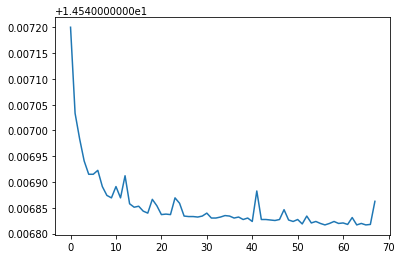

In [45]:
plt.plot(range(len(losses['loss_train'])),losses['loss_train'], label='train')
plt.show()

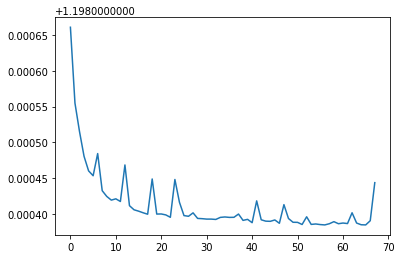

In [46]:
plt.plot(range(len(losses['loss_test'])),losses['loss_test'], label='dev')
plt.show()

In [47]:
#model.encoder(torch.tensor(tag_dataset_of.iloc[1].values.astype(np.float)).type(torch.FloatTensor))

In [48]:
hidden_representation = []
model.eval()
model = model.to('cpu')
with torch.no_grad():
    tag_dataset_of_rd = reduce_dims(tag_dataset_of)
    for index in range(len(tag_dataset_of)):
        hidden_representation.append(model.encoder(torch.tensor(tag_dataset_of_rd.iloc[index].values.astype(np.float)).type(torch.FloatTensor)).tolist())
    

/tmp/ipykernel_63240/1313768348.py:7: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  hidden_representation.append(model.encoder(torch.tensor(tag_dataset_of_rd.iloc[index].values.astype(np.float)).type(torch.FloatTensor)).tolist())


## FastText-like embedding for the games

In [51]:
train_fasttext = True
def row_to_token(row):
    return f"{row['name'].replace(' ', '') if row['name'] is str else str(row['name']).replace(' ', '')}-{''.join(row['popu_tags']).replace(' ', '') if all(isinstance(x, str) for x in row['popu_tags']) else ''}"

if train_fasttext:
    word_data = tag_dataset
    words = {}
    for i, row in word_data.iterrows():
        words[row['appid']] = row_to_token(row)
    print(len(words))

59946


In [52]:
from tqdm import tqdm

sentences = {}
if train_fasttext:
    for filename in ['data/games_1_sample.csv', 'data/games_2_sample.csv']:
        pt_df = pd.read_csv(filename, delimiter=',')
        pbar = tqdm(pt_df.iterrows())
        last_steam_id = None
        last_games = []
        for i, row in pbar:
            if row['playtime_forever'] > 180 and str(int(row['appid'])) in words:
                if row['steamid'] != last_steam_id:
                    if len(last_games) >= 4:
                        sentences[last_steam_id] = last_games
                        pbar.set_postfix({'sentences' : len(sentences)})
                    last_steam_id = row['steamid']
                    last_games = []
                last_games.append(row['appid'])
            if len(sentences) > 5000000:
                break

11528164it [05:44, 33502.52it/s, sentences=29192]
21479849it [10:55, 32766.23it/s, sentences=122561]


In [53]:
sentences_text = []
if train_fasttext:
    for i in sentences:
        word_list = []
        for word in sentences[i]:
            word_list.append(words[str(int(word))])
        sentences_text.append(' '.join(word_list) + '.')

In [54]:
if train_fasttext:
    with open('data/game_sentences.txt', 'w') as f:
        for sentence in sentences_text:
            f.write(f'{sentence}\n')

In [55]:
if train_fasttext:
    ft_model = fasttext.train_unsupervised('data/game_sentences.txt', dim=100, epoch=20, model='cbow', minCount=2, minn=6, maxn=10)

Read 0M words
Number of words:  4180
Number of labels: 0
Progress: 100.0% words/sec/thread:    5269 lr:  0.000000 avg.loss:  2.439902 ETA:   0h 0m 0s  6.4% words/sec/thread:    6090 lr:  0.046779 avg.loss:  2.733193 ETA:   0h 3m10s 20.8% words/sec/thread:    5924 lr:  0.039618 avg.loss:  2.623330 ETA:   0h 2m45s   5871 lr:  0.035842 avg.loss:  2.592598 ETA:   0h 2m31s 28.9% words/sec/thread:    5861 lr:  0.035559 avg.loss:  2.591303 ETA:   0h 2m30s 60.8% words/sec/thread:    5251 lr:  0.019594 avg.loss:  2.498743 ETA:   0h 1m32s 74.5% words/sec/thread:    5220 lr:  0.012741 avg.loss:  2.475157 ETA:   0h 1m 0s 74.9% words/sec/thread:    5218 lr:  0.012546 avg.loss:  2.474639 ETA:   0h 0m59s 75.1% words/sec/thread:    5217 lr:  0.012449 avg.loss:  2.474320 ETA:   0h 0m59s 89.8% words/sec/thread:    5225 lr:  0.005121 avg.loss:  2.454957 ETA:   0h 0m24s


In [56]:
if train_fasttext:
    ft_model.save_model("./fasttext_model.bin")

## Prepare data for recommendation in format: game name and representation

In [57]:
use_fasttext = True
if not use_fasttext:
    try:
        names_and_reps = pd.DataFrame(zip(hidden_representation,selected_df['name'].values.tolist()), columns=['representation','name'])
    except:
        names_and_reps = pd.read_pickle("./names_and_reps.pkl")
else:
    try:
        hidden_representation = []
        for i, row in selected_df.iterrows():
            hidden_representation.append(ft_model.get_word_vector(row_to_token(row)))
        names_and_reps = pd.DataFrame(zip(hidden_representation,selected_df['name'].values.tolist()), columns=['representation','name'])
    except:
        names_and_reps = pd.read_pickle("./names_and_reps.pkl")


In [58]:
names_and_reps

,representation,name
0,"[0.11460538, -0.051912818, -0.24489188, -0.109...",Among Us
1,"[-0.14550193, 0.09039803, -0.197401, 0.4995283...",Counter-Strike: Global Offensive
2,"[-0.18078859, 0.22232436, -0.03557059, 0.81990...",Fall Guys: Ultimate Knockout
3,"[0.7409131, -1.1284397, 0.22621447, -0.0863711...",Crusader Kings III
4,"[0.020191023, 0.6656576, -0.37125137, 0.283571...",Destiny 2
...,...,...
65473,"[0.047761764, 0.13671817, -0.10809672, 0.46459...",RIO - Raised In Oblivion
65474,"[0.17985435, -0.13631855, -0.23157464, -0.0947...",Polycalypse: Last bit of Hope
65475,"[-0.0601321, 0.10801401, -0.16185708, 0.403987...",Super Buckyball Tournament Preseason
65476,"[0.09242015, 0.16289374, 0.19465466, 0.684799,...",Lisa and the Grimoire


In [59]:
names_and_reps.to_pickle("./names_and_reps.pkl")

In [60]:
def calculate_point(first_game, second_game, weight):
    result = [0]*len(first_game)

    for index in range(len(first_game)):
        difference_tmp = abs(first_game[index] - second_game[index])
        if first_game[index] > second_game[index]:
            result[index] = first_game[index] - (difference_tmp * (1-weight))
        elif first_game[index] < second_game[index]:
            result[index] = first_game[index] + (difference_tmp * (1-weight))
        else:
            result[index] = 0
    return result
        

In [61]:
def get_top_n(target,data, n, standarize=False):
    vals = data['representation'].values.tolist()
    target = [target]
    if standarize:
        ss = StandardScaler()
        vals = ss.fit_transform(vals)
        target = ss.transform(target)
    all_dist = euclidean_distances(vals,target)
    indexes = all_dist.flatten().argsort()[:n]
    games = []
    for ind in list(indexes):
        games.append((data['name'].iloc[ind], all_dist.flatten()[ind]))
    return games
    

In [62]:
def get_games(first_name, second_name, weight, data, n):
    try:
        first_game = data[data['name']==first_name]['representation'].values[0]
    except:
        print(f"No such game in dataset: {first_name}")
        return [()]
    try:
        second_game = data[data['name']==second_name]['representation'].values[0]
    except:
        print(f"No such game in dataset: {second_name}")
        return [()]
    game_in_space = calculate_point(first_game, second_game, weight)
    games = get_top_n(game_in_space, data, n)
    return games

In [63]:
get_games('Half-Life', 'Half-Life 2', 0.5, names_and_reps, 10)

[('Half-Life 2', 1.0521283431590438),
 ('Half-Life', 1.052128350740233),
 ('Half-Life 2: Episode Two', 1.2009274987026501),
 ('Half-Life: Blue Shift', 1.4236546949621642),
 ('Half-Life 2: Episode One', 1.4576697026445593),
 ('Half-Life: Source', 1.460120900721903),
 ('Half-Life: Opposing Force', 1.6056652281794532),
 ('Portal', 1.9588574167947943),
 ('Grand Theft Auto III', 2.249887778762871),
 ('Resident Evil 2', 2.3987544199578323)]

In [64]:
get_games('Counter-Strike: Global Offensive', 'Team Fortress 2', 0.5, names_and_reps, 10)

[('Megalith', 1.3736387294772823),
 ('EARTH DEFENSE FORCE 5', 1.4764654739195853),
 ('Bleeding Edge', 1.5568316438651808),
 ("PLAYERUNKNOWN'S BATTLEGROUNDS", 1.6262050041536333),
 ('Crucible Beta', 1.6649719216270056),
 ('NBA 2K21', 1.7200967211904825),
 ('Morphies Law: Remorphed', 1.7331204955910104),
 ('Morphies Law: Remorphed', 1.7331204955910104),
 ('Ironsight', 1.7333376743882198),
 ('Dead by Daylight', 1.7401529057467156)]

In [65]:
get_games('Need for Speed™', 'Football Manager 2020', 0.5, names_and_reps, 10)

[('Starpoint Gemini 3 - Supporter Pack', 2.06209633047808),
 ('Festoon', 2.0668435523872257),
 ('Strike Suit Zero Heroes of the Fleet DLC', 2.0691019647224076),
 ('Flatwaters: The Curse of Echita', 2.0999492700639517),
 ('Airport Simulator 2014', 2.1409605509553056),
 ('Strike Suit Zero - Raptor DLC', 2.1536465563192224),
 ('Interstellar Rift - Original Sound Track', 2.1626613642314023),
 ('Vector 36 - Garage Upgrade 1 ( x2 slot )', 2.171868874654325),
 ('Vector 36 Racewear- Vanguard Blitz / Grid', 2.178191163431519),
 ('Catch a Lover - Nightmare', 2.18085992458429)]

# PCA analysis

In [58]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(names_and_reps['representation'].values.tolist())
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [59]:
finalDf = pd.concat([principalDf, names_and_reps['name']], axis = 1) 

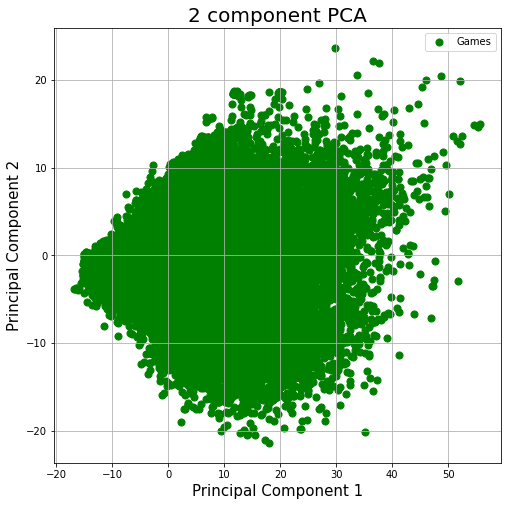

In [60]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['Games']
colors = ['g']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['principal component 2']
    ax.scatter(finalDf.loc[:, 'principal component 1']
               , finalDf.loc[:, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

## Bonus interactive data exploration

In [61]:
import plotly.express as px
fig = px.scatter(finalDf, x="principal component 1", y="principal component 2", hover_data=['name'])
fig.show()